# Análisis de información sobre expresión génica en el cáncer de mama

Estudio mediante datos clínicos y de expresión de genes obtenido de la base de datos https://linkedomics.org/data_download/TCGA-BRCA/

Clinical annotation y RNAseq data normalized counts (Illumina HiSeq platform, Gene-level, RPKM)

In [2]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
expression_data  = pd.read_csv('data.cct', sep='\t', index_col=0)
expression_data = expression_data.T
print("Datos de expresión génica:")
print(expression_data.shape)
expression_data .head()

Datos de expresión génica:
(1093, 20155)


attrib_name,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,AAAS,...,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,psiTPTE22,tAKR
TCGA.3C.AAAU,7.6300,0.0000,0.000,6.6999,1.2501,12.5017,6.1136,3.2655,0.4273,9.3450,...,7.0289,9.9784,10.6965,8.0196,10.2400,11.7765,10.8887,10.2064,1.4454,0.0
TCGA.3C.AALI,7.8971,0.0000,0.000,6.1672,2.4196,12.8866,7.3101,0.6265,0.0000,9.7960,...,5.9264,8.8125,10.3924,7.6401,9.2398,12.4267,10.3659,8.6715,9.8573,0.0
TCGA.3C.AALJ,8.7287,0.9310,0.000,7.3422,0.0000,13.1101,9.1671,0.0000,0.0000,9.5008,...,5.1842,9.0634,9.5884,8.3786,9.0585,12.4146,9.8825,8.9958,5.1842,0.0
TCGA.3C.AALK,7.5851,0.0000,0.000,5.9888,1.4087,13.4201,8.9870,0.0000,0.0000,9.6036,...,5.8080,8.7772,9.7564,7.4629,9.2488,12.4748,9.6113,9.4551,6.0792,0.0
TCGA.4H.AAAK,8.0762,0.5115,2.272,7.2796,2.1389,13.2268,8.4226,0.5115,0.5115,9.6797,...,5.6420,8.7322,10.0373,3.9110,9.6013,11.9811,9.7020,9.7858,7.5564,0.0


Se tienen 1093 secuencias de RNA normalizadas con 20155 genes identificados por su nivel de expresión

In [4]:
clinical_data = pd.read_csv('clinical.txt', sep='\t', index_col=0)
clinical_data = clinical_data.T
print("Datos clínicos:")
print(clinical_data.shape)


Datos clínicos:
(1097, 20)


Hay 1097 sujetos con 20 datos clínicos

In [5]:
clinical_data.head()

attrib_name,years_to_birth,Tumor_purity,pathologic_stage,pathology_T_stage,pathology_N_stage,pathology_M_stage,histological_type,number_of_lymph_nodes,PAM50,ER.Status,PR.Status,HER2.Status,gender,radiation_therapy,race,ethnicity,Median_overall_survival,overall_survival,status,overallsurvival
TCGA.5L.AAT0,42,0.6501,stageii,t2,n0,m0,infiltratinglobularcarcinoma,0,NaN,NaN,NaN,NaN,female,yes,white,hispanicorlatino,0,1477,0,"1477,0"
TCGA.5L.AAT1,63,0.5553,stageiv,t2,n0,m1,infiltratinglobularcarcinoma,0,NaN,NaN,NaN,NaN,female,no,white,hispanicorlatino,0,1471,0,"1471,0"
TCGA.A1.A0SP,40,0.6913,stageii,t2,n0,m0,infiltratingductalcarcinoma,0,Basal,NaN,NaN,NaN,female,NaN,NaN,nothispanicorlatino,0,584,0,"584,0"
TCGA.A2.A04V,39,0.8341,stageii,t2,n0,m0,infiltratingductalcarcinoma,0,LumA,NaN,NaN,NaN,female,no,white,nothispanicorlatino,0,1920,1,"1920,1"
TCGA.A2.A04Y,53,0.7318,stageii,t2,n1,m0,infiltratingductalcarcinoma,1,LumB,NaN,NaN,NaN,female,yes,white,NaN,0,1099,0,"1099,0"


In [6]:
print(clinical_data.columns)


Index(['years_to_birth', 'Tumor_purity', 'pathologic_stage',
       'pathology_T_stage', 'pathology_N_stage', 'pathology_M_stage',
       'histological_type', 'number_of_lymph_nodes', 'PAM50', 'ER.Status',
       'PR.Status', 'HER2.Status', 'gender', 'radiation_therapy', 'race',
       'ethnicity', 'Median_overall_survival', 'overall_survival', 'status',
       'overallsurvival'],
      dtype='object', name='attrib_name')


In [7]:
# Extraer etiquetas
labels = clinical_data['PAM50']

# Revisar distribución de subtipos
labels.value_counts()


PAM50
LumA     426
LumB     186
Basal    147
Her2      67
Name: count, dtype: int64

In [8]:
# Merge the two datasets on their common samples (index)
df = pd.concat([expression_data, clinical_data], axis=1, join='inner')

# Display the combined dataset
print("Combined dataset shape:", df.shape)
df.head()


Combined dataset shape: (1093, 20175)


attrib_name,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,AAAS,...,PR.Status,HER2.Status,gender,radiation_therapy,race,ethnicity,Median_overall_survival,overall_survival,status,overallsurvival
TCGA.3C.AAAU,7.6300,0.0000,0.000,6.6999,1.2501,12.5017,6.1136,3.2655,0.4273,9.3450,...,NaN,NaN,female,no,white,nothispanicorlatino,1,4047,0,"4047,0"
TCGA.3C.AALI,7.8971,0.0000,0.000,6.1672,2.4196,12.8866,7.3101,0.6265,0.0000,9.7960,...,NaN,NaN,female,yes,blackorafricanamerican,nothispanicorlatino,1,4005,0,"4005,0"
TCGA.3C.AALJ,8.7287,0.9310,0.000,7.3422,0.0000,13.1101,9.1671,0.0000,0.0000,9.5008,...,NaN,NaN,female,no,blackorafricanamerican,nothispanicorlatino,0,1474,0,"1474,0"
TCGA.3C.AALK,7.5851,0.0000,0.000,5.9888,1.4087,13.4201,8.9870,0.0000,0.0000,9.6036,...,NaN,NaN,female,no,blackorafricanamerican,nothispanicorlatino,0,1448,0,"1448,0"
TCGA.4H.AAAK,8.0762,0.5115,2.272,7.2796,2.1389,13.2268,8.4226,0.5115,0.5115,9.6797,...,NaN,NaN,female,no,white,nothispanicorlatino,0,348,0,"348,0"


In [9]:
print(df.columns)

Index(['A1BG', 'A1CF', 'A2BP1', 'A2LD1', 'A2ML1', 'A2M', 'A4GALT', 'A4GNT',
       'AAA1', 'AAAS',
       ...
       'PR.Status', 'HER2.Status', 'gender', 'radiation_therapy', 'race',
       'ethnicity', 'Median_overall_survival', 'overall_survival', 'status',
       'overallsurvival'],
      dtype='object', name='attrib_name', length=20175)


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1093 entries, TCGA.3C.AAAU to TCGA.Z7.A8R6
Columns: 20175 entries, A1BG to overallsurvival
dtypes: float64(20155), object(20)
memory usage: 168.2+ MB


In [11]:
df["PAM50"].value_counts()

PAM50
LumA     426
LumB     186
Basal    147
Her2      67
Name: count, dtype: int64

In [12]:
df = df.dropna(subset=["PAM50"])
df = df.drop(['ER.Status', 'PR.Status', 'HER2.Status', 'ethnicity'], axis=1) # por la ausencia de tantos datos
df = df.dropna()

In [13]:
df["PAM50"].value_counts()

PAM50
LumA     285
Basal    107
LumB     102
Her2      29
Name: count, dtype: int64

In [14]:
df.head()

attrib_name,A1BG,A1CF,A2BP1,A2LD1,A2ML1,A2M,A4GALT,A4GNT,AAA1,AAAS,...,histological_type,number_of_lymph_nodes,PAM50,gender,radiation_therapy,race,Median_overall_survival,overall_survival,status,overallsurvival
TCGA.A2.A04N,7.5274,0.0000,0.0000,7.0035,0.4815,13.2631,9.4905,1.7558,0.0,9.6661,...,infiltratingductalcarcinoma,0,LumA,female,yes,white,1,4354,0,"4354,0"
TCGA.A2.A04P,6.7781,0.0000,0.0000,6.4863,10.6854,13.1825,7.2424,0.0000,0.0,9.6694,...,infiltratingductalcarcinoma,18,Basal,female,yes,blackorafricanamerican,0,548,1,"548,1"
TCGA.A2.A04Q,6.8484,0.0000,0.0000,6.7734,11.1640,13.6421,8.7822,1.3463,0.0,9.3133,...,infiltratingductalcarcinoma,0,Basal,female,no,white,0,2385,0,"2385,0"
TCGA.A2.A04R,7.7186,0.4459,0.0000,6.0986,0.4459,12.8597,8.2332,1.2921,0.0,9.7110,...,infiltratingductalcarcinoma,0,LumB,female,yes,blackorafricanamerican,0,3709,0,"3709,0"
TCGA.A2.A04T,6.0553,0.0000,0.7617,6.2712,13.7596,13.6180,6.9754,0.0000,0.0,8.5447,...,infiltratingductalcarcinoma,0,Basal,female,yes,white,0,2246,0,"2246,0"


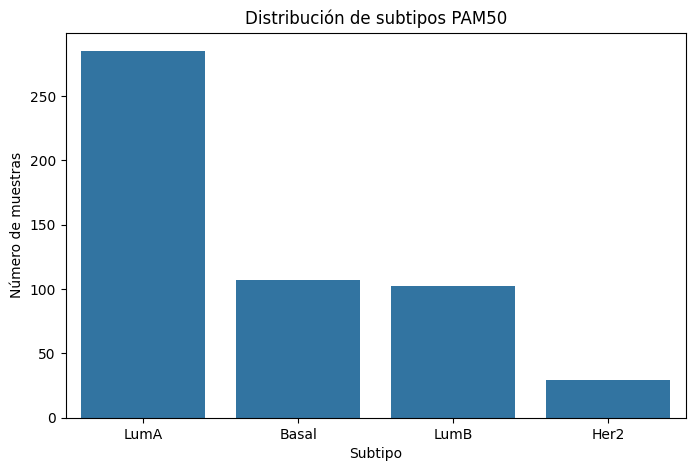

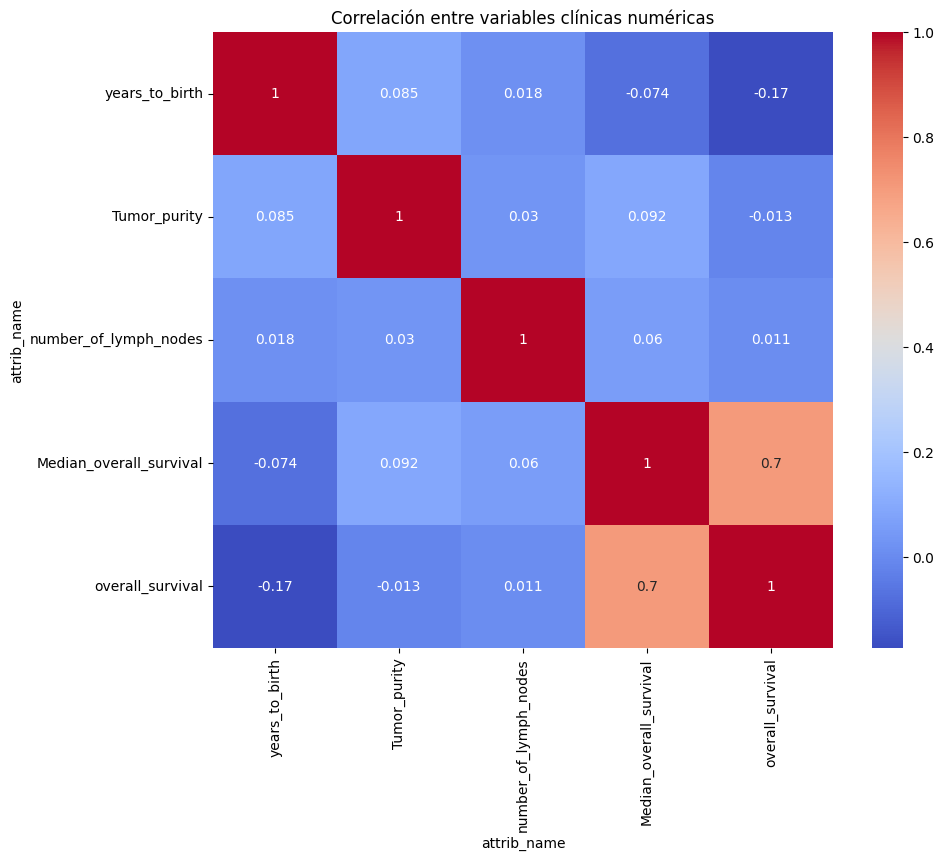

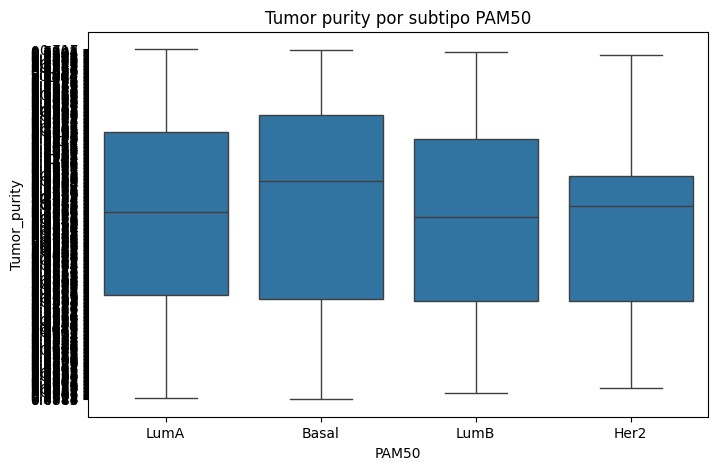

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1.1 Distribución de subtipos PAM50 (etiqueta objetivo)
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='PAM50', order=df['PAM50'].value_counts().index)
plt.title('Distribución de subtipos PAM50')
plt.xlabel('Subtipo')
plt.ylabel('Número de muestras')
plt.show()

# 1.2 Matriz de correlación entre algunas variables clínicas numéricas
numeric_cols = ['years_to_birth', 'Tumor_purity', 'number_of_lymph_nodes', 'Median_overall_survival', 'overall_survival']
plt.figure(figsize=(10,8))
sns.heatmap(df[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlación entre variables clínicas numéricas')
plt.show()

# 1.3 Boxplot de Tumor_purity por subtipo PAM50
plt.figure(figsize=(8,5))
sns.boxplot(x='PAM50', y='Tumor_purity', data=df)
plt.title('Tumor purity por subtipo PAM50')
plt.show()


In [ ]:
# 2.1 Eliminar filas con valores faltantes en la columna objetivo 'PAM50'
df = df.dropna(subset=['PAM50'])

# 2.2 Imputar o eliminar valores faltantes en variables numéricas
# Por simplicidad, eliminaremos filas con NA en variables numéricas
df = df.dropna(subset=numeric_cols)

# 2.3 Codificar variables categóricas clínicas
categorical_cols = df.select_dtypes(include = ["int64","object"]).columns

for col in categorical_cols:
    df[col] = df[col].astype('category').cat.codes

# 2.4 Preparar matriz X y vector y
X = df.drop(columns=['PAM50'])
y = df ['PAM50']

# Codificar etiquetas objetivo
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)
print("Clases:", le.classes_)


Clases: [0 1 2 3]


In [ ]:
from sklearn.feature_selection import VarianceThreshold

# Eliminar genes con muy poca varianza (ejemplo: umbral 0.01)
selector = VarianceThreshold(threshold=0.01)
X_reduced = selector.fit_transform(X)

print(f"Dimensión original: {X.shape}")
print(f"Dimensión después de VarianceThreshold: {X_reduced.shape}")


Dimensión original: (664, 20174)
Dimensión después de VarianceThreshold: (664, 19769)


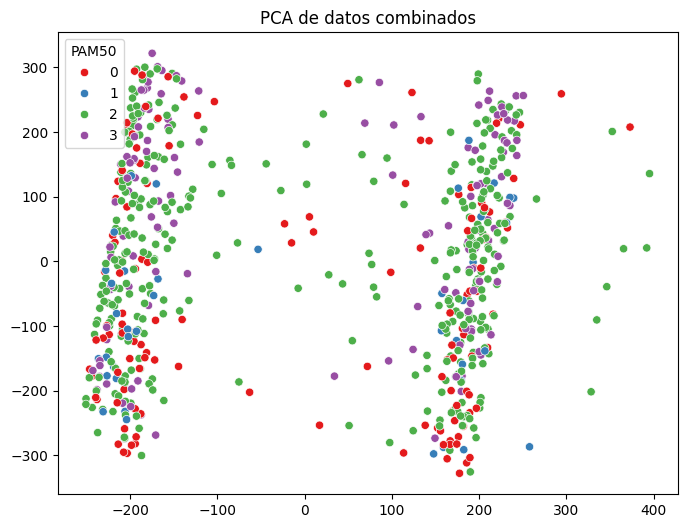

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_reduced)

plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=y, palette='Set1')
plt.title('PCA de datos combinados')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_reduced)

# División en train/test (puedes usar la misma que usaste antes)
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

n_clases = len(np.unique(y_encoded))  # Número de clases

model = keras.Sequential([
    layers.Input(shape=(X_train.shape[1],)),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(n_clases, activation='softmax' if n_clases > 2 else 'sigmoid')
])


In [ ]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy' if n_clases > 2 else 'binary_crossentropy',
    metrics=['accuracy']
)


In [ ]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=30,  # Puedes ajustar el número de épocas
    batch_size=32,
    verbose=1
)


Epoch 1/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.7038 - loss: 1.6564 - val_accuracy: 0.8571 - val_loss: 0.8749
Epoch 2/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8621 - loss: 1.8854 - val_accuracy: 0.8722 - val_loss: 1.1133
Epoch 3/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9060 - loss: 1.3126 - val_accuracy: 0.9023 - val_loss: 0.7616
Epoch 4/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.9235 - loss: 0.5969 - val_accuracy: 0.9098 - val_loss: 0.6830
Epoch 5/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9132 - loss: 0.7571 - val_accuracy: 0.9323 - val_loss: 0.6880
Epoch 6/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9723 - loss: 0.2011 - val_accuracy: 0.9248 - val_loss: 1.0419
Epoch 7/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9468 - loss: 0.5116 - val_accuracy: 0.9398 - val_loss: 0.3636
Epoch 8/30
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9369 - loss: 0.7677 - val_accuracy: 0.9323 - v

In [ ]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Accuracy en test: {accuracy:.4f}")

# Predicciones y métricas detalladas
y_pred_nn = np.argmax(model.predict(X_test), axis=1) if n_clases > 2 else (model.predict(X_test) > 0.5).astype(int).ravel()

print("=== Informe de Clasificación (Red Neuronal) ===")
target_names = le.classes_.astype(str)
print(classification_report(y_test, y_pred_nn,target_names=target_names))


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.8970 - loss: 1.3768
Accuracy en test: 0.8797
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
=== Informe de Clasificación (Red Neuronal) ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       0.45      0.62      0.53         8
           2       0.97      0.89      0.93        72
           3       0.73      0.81      0.77        27

    accuracy                           0.88       133
   macro avg       0.79      0.83      0.81       133
weighted avg       0.90      0.88      0.89       133



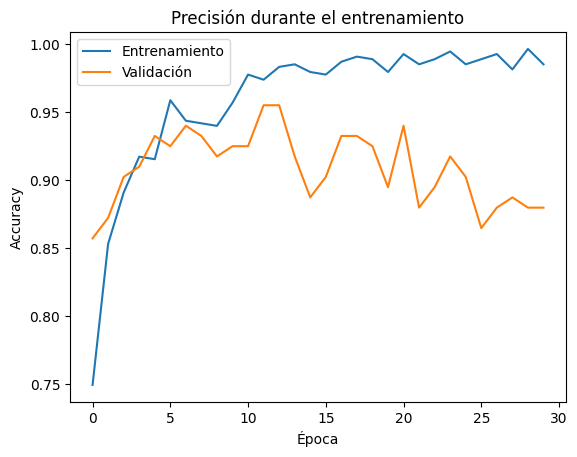

In [ ]:
plt.plot(history.history['accuracy'], label='Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Validación')
plt.xlabel('Época')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Precisión durante el entrenamiento')
plt.show()


=== Regresión Logística ===
Accuracy: 0.9173
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       0.71      0.62      0.67         8
           2       0.96      0.94      0.95        72
           3       0.79      0.85      0.82        27

    accuracy                           0.92       133
   macro avg       0.87      0.86      0.86       133
weighted avg       0.92      0.92      0.92       133

Matriz de confusión:


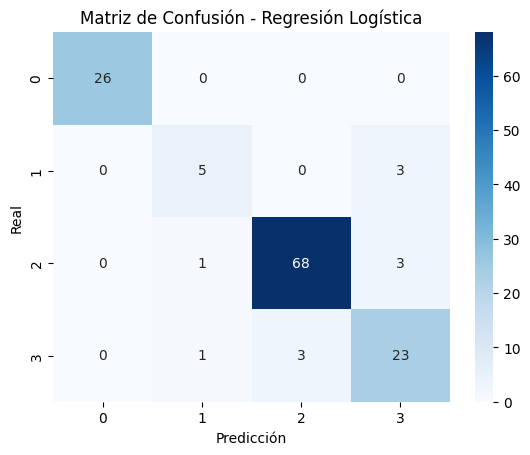

=== Random Forest ===
Accuracy: 0.9474
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        26
           1       1.00      0.62      0.77         8
           2       0.95      0.97      0.96        72
           3       0.93      0.93      0.93        27

    accuracy                           0.95       133
   macro avg       0.96      0.88      0.91       133
weighted avg       0.95      0.95      0.95       133

Matriz de confusión:


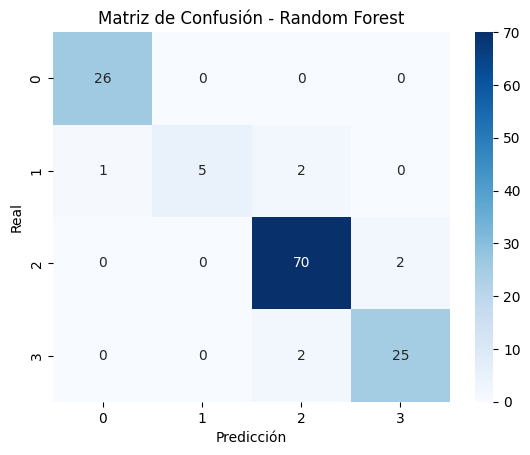

=== SVM ===
Accuracy: 0.9248
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        26
           1       0.75      0.75      0.75         8
           2       0.97      0.94      0.96        72
           3       0.82      0.85      0.84        27

    accuracy                           0.92       133
   macro avg       0.88      0.89      0.88       133
weighted avg       0.93      0.92      0.93       133

Matriz de confusión:


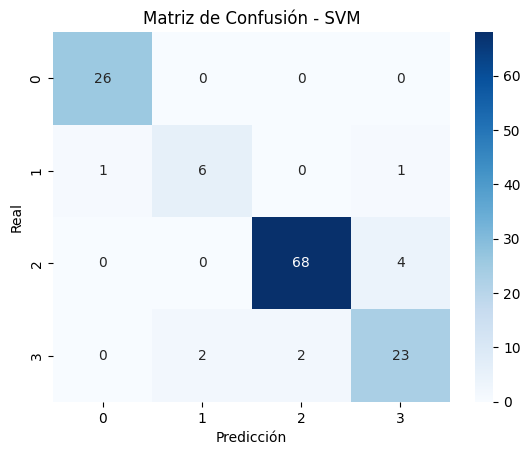

=== KNN ===
Accuracy: 0.7519
              precision    recall  f1-score   support

           0       0.92      0.88      0.90        26
           1       0.50      0.25      0.33         8
           2       0.71      0.97      0.82        72
           3       1.00      0.19      0.31        27

    accuracy                           0.75       133
   macro avg       0.78      0.57      0.59       133
weighted avg       0.80      0.75      0.70       133

Matriz de confusión:


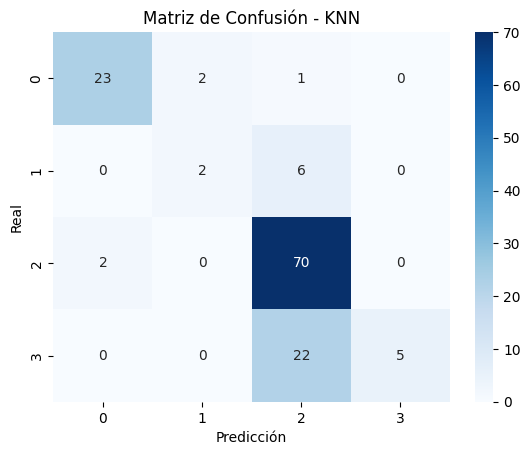

=== Naive Bayes ===
Accuracy: 0.7068
              precision    recall  f1-score   support

           0       0.92      0.88      0.90        26
           1       0.00      0.00      0.00         8
           2       0.72      0.88      0.79        72
           3       0.40      0.30      0.34        27

    accuracy                           0.71       133
   macro avg       0.51      0.51      0.51       133
weighted avg       0.65      0.71      0.67       133

Matriz de confusión:


d:\Coding\Laboratorios IA\entorno\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Coding\Laboratorios IA\entorno\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\Coding\Laboratorios IA\entorno\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


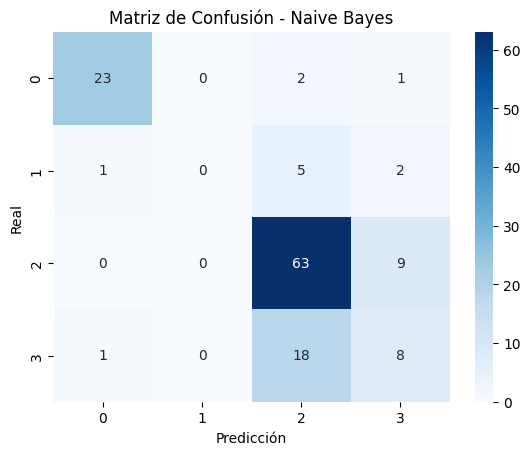

=== Gradient Boosting ===
Accuracy: 0.9624
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        26
           1       0.86      0.75      0.80         8
           2       0.99      0.99      0.99        72
           3       0.90      0.96      0.93        27

    accuracy                           0.96       133
   macro avg       0.93      0.92      0.92       133
weighted avg       0.96      0.96      0.96       133

Matriz de confusión:


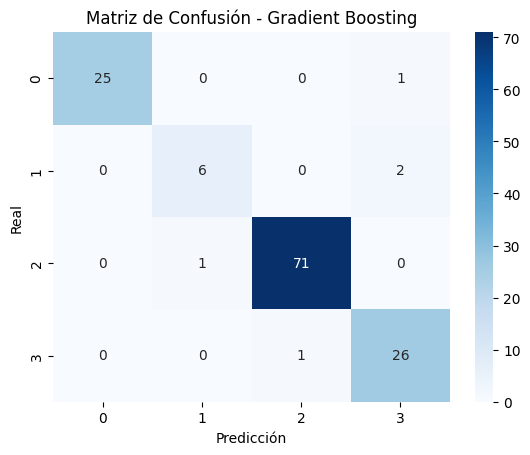

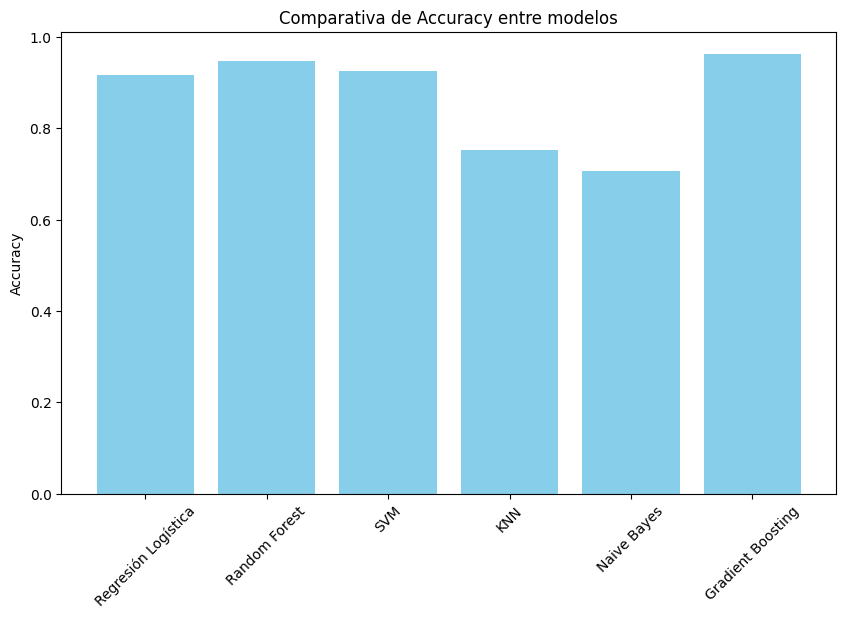

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# 1. División de datos
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 2. Definir modelos
modelos = {
    "Regresión Logística": LogisticRegression(max_iter=1000),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42),
    "SVM": SVC(kernel='linear', probability=True),
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "Naive Bayes": GaussianNB(),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42)
}

resultados = {}

# 3. Entrenar, predecir y evaluar
for nombre, modelo in modelos.items():
    modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"=== {nombre} ===")
    print(f"Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred))
    print("Matriz de confusión:")
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Matriz de Confusión - {nombre}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.show()
    resultados[nombre] = acc

# 4. Comparar accuracy entre modelos
plt.figure(figsize=(10,6))
plt.bar(resultados.keys(), resultados.values(), color='skyblue')
plt.ylabel('Accuracy')
plt.title('Comparativa de Accuracy entre modelos')
plt.xticks(rotation=45)
plt.show()
